<a href="https://colab.research.google.com/github/YashVashisth27/Dog_Vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-class Dog Breed Classification


In [ ]:
# from google.colab import drive # to mount google drive 
# drive.mount('/content/drive')

In [ ]:
# !unzip "drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision" # to unzip the file which contains the data images

# Getting Workspace ready

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
# print("TF version:",tf.__version__)
# print("TF hub version",hub.__version__)
# The above two commands are used to verify the version of tensorflow and tensorflowHUB

In [ ]:
import pandas as pd
import numpy as np

labels_csv=pd.read_csv("drive/My Drive/Dog Vision/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     1321d074e879267699d42fdca77b4004  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


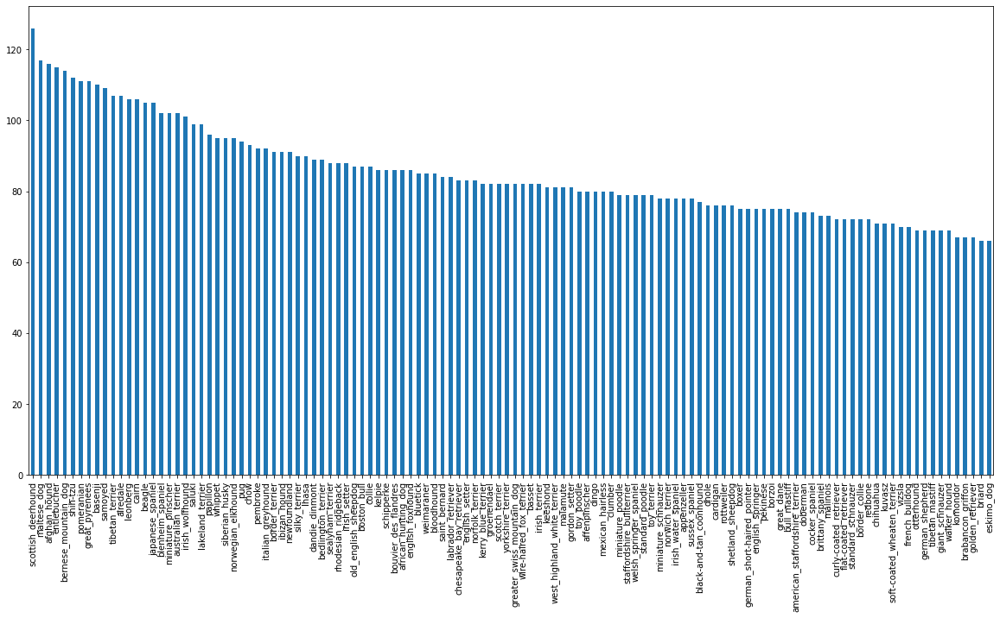

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv[labels_csv["breed"]=="maltese_dog"].value_counts().sum()

117

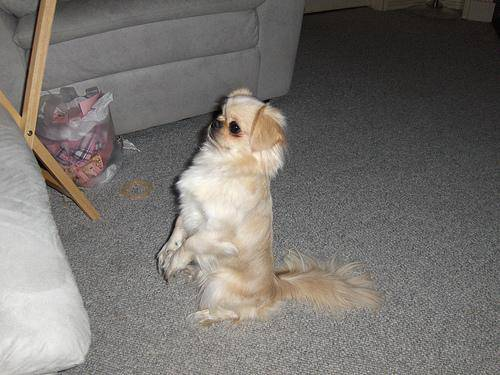

In [ ]:
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

## Getting Images and Labels

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
tempfname=[fname for fname in labels_csv["id"]]
tempfname

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64',
 '004396df1acd0f1247b740ca2b14616e',
 '0067dc3eab0b3c3ef0439477624d85d6',
 '00693b8bc2470375cc744a6391d397ec',
 '006cc3ddb9dc1bd827479569fcdc52dc',
 '0075dc49dab4024d12fafe67074d8a81',
 '00792e341f3c6eb33663e415d0715370',
 '007b5a16db9d9ff9d7ad39982703e429',
 '007b8a07882822475a4ce6581e70b1f8',
 '007ff9a78eba2aebb558afea3a51c469',
 '008887054b18ba3c7601792b6a453cc3',
 '008b1271ed1addaccf93783b39deab45',
 '008ba178d6dfc1a583617470d19c1673',
 '009509be3ca7cce0ff9e37c8b09b1125',
 '0097c6242c6f3071762d9f85c3ef1b2f',
 '00a338a92e4e7bf543340dc849230e75',
 '00a366d4b4a9bbb6c8a63126697b7656',
 '00a862390341c5be090dd72bd2bc19ef',
 

In [ ]:
filenames=["drive/My Drive/Dog Vision/train/"+fname+".jpg" for fname in labels_csv["id"]]

In [ ]:
filenames

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/My Drive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/My Drive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/My Drive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/My Drive/Dog Vision/train/006cc3ddb9dc1bd82

In [ ]:
# os.listdir("drive/My Drive/Dog Vision/train/")

In [ ]:
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/"))==len(filenames):
  print("Filenames match")
else:
  print("Filenames don't match")

Filenames match


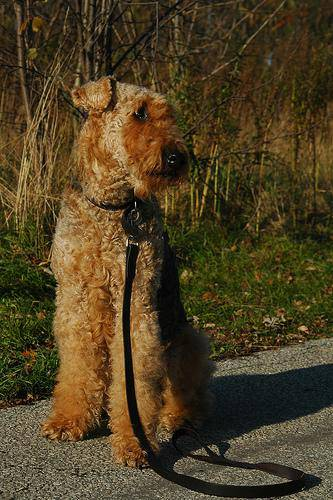

In [ ]:
Image(filenames[5000])

In [ ]:
labels_csv["breed"][6089]

'boston_bull'

In [ ]:
labels=labels_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)
np.unique(labels)

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
if len(labels)== len(filenames):
  print("no missing values")
else:
  print("missing values present")


no missing values


In [ ]:
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

#### turning a single label into into an array of booleans


In [ ]:
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels=[label==unique_breeds for label in labels]

In [ ]:
len(boolean_labels)

10222

In [ ]:
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
print(labels[0])

boston_bull


In [ ]:
print(np.where(unique_breeds==labels[0]))   
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# Creating a validation set
X=filenames
y=boolean_labels

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)

len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2],y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, F

Preprocessing Images (Turning images into tensors)

In [ ]:
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [ ]:
IMG_SIZE=224

# Function for preprocessing images

def process_image(image_path,img_size=IMG_SIZE):
  '''
  Takes a image filepath and read the image and then turn the image into tensors
  '''
  # Read in an image file
  image=tf.io.read_file(image_path)

  #Turn the jpeg image into numerical Tensor with 3 colour channels(RGB) 
  image=tf.image.decode_jpeg(image,channels=3)

  # scale the tensor from range of 0-255 to 0-1
  image=tf.image.convert_image_dtype(image,tf.float32)
  
  # Resize the image to a desired value
  image=tf.image.resize(image,size=[img_size,img_size])
  
  return image


##Turning our data into batches



In [ ]:
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label
  

In [ ]:
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Define the batch size, we will use 32 here
BATCH_SIZE=32
# Create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input(no labels for test data)
  """
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices(tf.constant(X))       #only filepaths(no labels)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch 
  # If the data is a valid dataset,we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                            tf.constant(y))) #labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating Training data batches...")
    # Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    # Shuffling pathnames and labels before mapping
    data=data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples(this also turns the image path into a preprocessed image)
    data=data.map(get_image_label)

    # Turn the training data into batches
    data_batch=data.batch(BATCH_SIZE)

  return data_batch
                    
    

In [ ]:
# Create training and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating Training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

##Visualizing Data Batches


In [ ]:
import matplotlib.pyplot as plt
# Creating a function for viewing images in data batch

def show_25_images(images,labels):
  """
  Displays a plot of 25 iamges and their labels from data batch
  """

  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 images
  for i in range(25):
    # Create subplots(5,5)
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")
    

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images,train_labels 

(array([[[[2.42038548e-01, 2.89097369e-01, 3.36156189e-01],
          [2.77943313e-01, 3.25002134e-01, 3.72060955e-01],
          [3.09375644e-01, 3.56434464e-01, 4.03493285e-01],
          ...,
          [4.55130190e-01, 4.66894895e-01, 4.86502737e-01],
          [5.63288450e-01, 5.75053155e-01, 5.94660997e-01],
          [5.92560709e-01, 6.04325414e-01, 6.23933256e-01]],
 
         [[3.27548712e-01, 3.74607563e-01, 4.21666384e-01],
          [3.48395705e-01, 3.95454556e-01, 4.42513376e-01],
          [3.20570588e-01, 3.67629439e-01, 4.14688259e-01],
          ...,
          [5.43264985e-01, 5.58951259e-01, 5.68621993e-01],
          [5.65502048e-01, 5.81188321e-01, 5.92878878e-01],
          [4.71629947e-01, 4.87316221e-01, 4.96838748e-01]],
 
         [[2.78982371e-01, 3.26041192e-01, 3.73100013e-01],
          [2.42811844e-01, 2.89870650e-01, 3.36929500e-01],
          [2.43029609e-01, 2.90088445e-01, 3.37147266e-01],
          ...,
          [5.35364389e-01, 5.51555514e-01, 5.4339

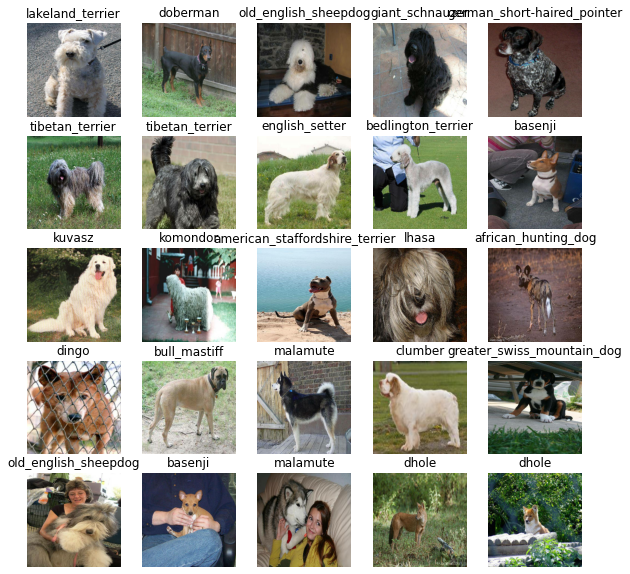

In [ ]:
show_25_images(train_images,train_labels)

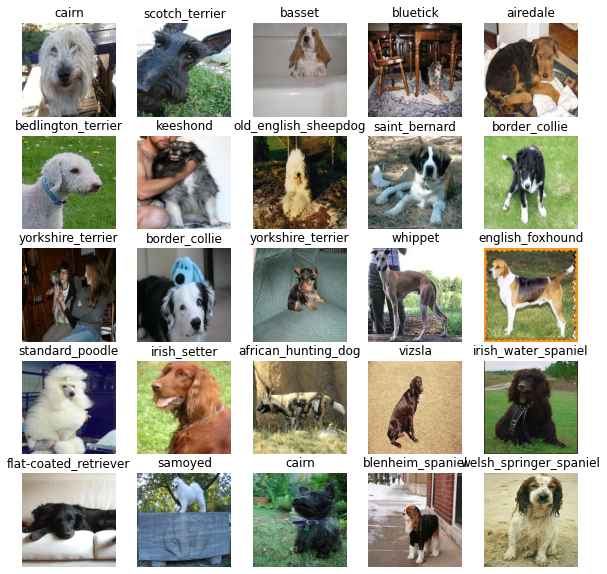

In [ ]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Builing a Model
Before we build a model, there are a few things we need to define

-The input shape (Images in the form of tensors) 

-The output shape (Labels in the form of tensors)

-The URL of the model we want to use

In [ ]:
# Setup imput shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] #batch,height,width,colour channels

# Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

# Setup Model URL from TensorFlow HUB
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
# Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup model layers
  model=tf.keras.Sequential([
   hub.KerasLayer(MODEL_URL), #LAYER 1
   tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax") #Output Layer

  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)
  return model

In [ ]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks
Callbacks are helper functions a model can use during training to do such things as save it's progress,check it's progress or stop training early if a model starts improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

In [ ]:
# TensorBoard Callback
# Load TensorBoard notebook extension

%load_ext tensorboard

In [ ]:
import datetime

# Create a funciton to build a tensorboard callback

def create_tensorboard_callback():
  logdir= os.path.join("drive/My Drive/Dog Vision/logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)
  

### Early Stopping Callback

Early Stopping helps too stop our model from overfitting by stoping if a certain evaluation metric stops improving.


In [ ]:
# Creating Early Stopping Callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3)

##Training a model (on subset of data)
The first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS= 100 #@param{type:"slider",min:10,max:100,step:10}

In [ ]:
 print("GPU","available(Yes)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available(Yes)


##Creating a function which trains a model





* Create a model using 'create_model()'
* Setup a TensorBoard Callback using 'create_tensorboard_callback()'



* Call the 'fit()' function on our model passing it the training data, validation data,number of epochs to train for 'NUM_EPOCHS' and callbacks we'd like to use
* Return the Model




In [ ]:
def train_model():
  """
  Trains a gien model and returns the trained version.
  """
  # Create a model
  model=create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard= create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  
  return model


In [ ]:
model= train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 364s 13s/step - loss: 4.6111 - accuracy: 0.0913 - val_loss: 3.5857 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 4s 163ms/step - loss: 1.6890 - accuracy: 0.6625 - val_loss: 2.2537 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 4s 164ms/step - loss: 0.5925 - accuracy: 0.9250 - val_loss: 1.7334 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 5s 180ms/step - loss: 0.2512 - accuracy: 0.9912 - val_loss: 1.5143 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 5s 179ms/step - loss: 0.1451 - accuracy: 1.0000 - val_loss: 1.4250 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 160ms/step - loss: 0.0989 - accuracy: 1.0000 - val_loss: 1.3840 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================

###Checking the tensorboard logs


In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

In [ ]:
# Making and evaluating predictions using a trained model
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 130ms/step


array([[4.4441043e-04, 4.8423422e-05, 1.2411424e-03, ..., 1.0522470e-04,
        1.9114518e-06, 1.5928387e-03],
       [8.1736296e-03, 5.3266948e-04, 3.6054854e-03, ..., 4.0184660e-04,
        1.5830549e-03, 2.9920298e-05],
       [1.2225372e-06, 7.3012663e-05, 8.5035890e-06, ..., 4.0003826e-05,
        6.2870298e-05, 1.0570336e-04],
       ...,
       [2.0906948e-07, 5.9222175e-06, 1.9997686e-05, ..., 3.4236029e-06,
        4.0257637e-05, 1.9960513e-05],
       [2.9809254e-03, 2.7507544e-04, 1.8739517e-04, ..., 1.2409547e-04,
        5.9255079e-05, 2.8175879e-03],
       [1.3404683e-04, 1.8958615e-05, 1.8337981e-03, ..., 5.3077787e-03,
        1.3461536e-04, 2.5212921e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0]

array([4.44410427e-04, 4.84234224e-05, 1.24114240e-03, 1.22082449e-04,
       3.99587552e-05, 1.77221900e-05, 2.45771222e-02, 1.69589533e-04,
       2.27574365e-05, 4.66600410e-04, 7.72355343e-05, 2.60280794e-05,
       9.32378753e-05, 2.34429408e-05, 1.29879409e-04, 1.30532205e-03,
       6.05485038e-05, 2.53874302e-01, 4.44321631e-06, 8.82737822e-06,
       3.86121916e-03, 1.94820153e-04, 2.36166434e-05, 6.41386549e-04,
       2.51083511e-05, 6.78812430e-05, 4.94037420e-01, 8.73801328e-05,
       1.82388525e-04, 8.06422322e-04, 6.51761220e-05, 1.24917994e-03,
       7.97129469e-04, 3.69578884e-05, 3.69001973e-05, 2.22064685e-02,
       2.41237030e-05, 3.76068965e-05, 6.01660104e-05, 1.67977967e-04,
       4.21492528e-04, 2.99338026e-05, 1.34054513e-04, 3.64610823e-05,
       1.02807164e-04, 3.92800175e-05, 4.75504294e-06, 1.71387364e-04,
       1.29762659e-04, 1.64169105e-05, 5.10540049e-05, 5.79674861e-06,
       1.40861535e-04, 6.23430897e-05, 3.80736783e-05, 5.09130477e-05,
      

In [ ]:
index = 42
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[4.44410427e-04 4.84234224e-05 1.24114240e-03 1.22082449e-04
 3.99587552e-05 1.77221900e-05 2.45771222e-02 1.69589533e-04
 2.27574365e-05 4.66600410e-04 7.72355343e-05 2.60280794e-05
 9.32378753e-05 2.34429408e-05 1.29879409e-04 1.30532205e-03
 6.05485038e-05 2.53874302e-01 4.44321631e-06 8.82737822e-06
 3.86121916e-03 1.94820153e-04 2.36166434e-05 6.41386549e-04
 2.51083511e-05 6.78812430e-05 4.94037420e-01 8.73801328e-05
 1.82388525e-04 8.06422322e-04 6.51761220e-05 1.24917994e-03
 7.97129469e-04 3.69578884e-05 3.69001973e-05 2.22064685e-02
 2.41237030e-05 3.76068965e-05 6.01660104e-05 1.67977967e-04
 4.21492528e-04 2.99338026e-05 1.34054513e-04 3.64610823e-05
 1.02807164e-04 3.92800175e-05 4.75504294e-06 1.71387364e-04
 1.29762659e-04 1.64169105e-05 5.10540049e-05 5.79674861e-06
 1.40861535e-04 6.23430897e-05 3.80736783e-05 5.09130477e-05
 1.22243568e-04 4.23618872e-03 1.65177407e-04 2.72768307e-02
 1.92228137e-04 4.76531159e-06 2.46969576e-04 1.35256932e-05
 1.58171868e-04 3.691693

In [ ]:
# Turn Prediction probabilities into their respective label

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


pred_label=get_pred_label(predictions[0])
pred_label

'cairn'

In [ ]:
# Checking on validation images
images_1=[]
labels_1=[]

for image,label in val_data.unbatch().as_numpy_iterator():
  images_1.append(image)
  labels_1.append(label)

In [ ]:
def unbatch_data(data):
  """
  Takes a batched dataset of Tensors and returns separate arrays of images and labels.
  """
  images_=[]
  labels_=[]

  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_,labels_

val_images,val_labels=unbatch_data(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_1[0],labels_1[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_1[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'

In [ ]:
def plot_pred(prediction_probabilities, labels,images,n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image=prediction_probabilities[n], labels[n],images[n]

  pred_label=get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([  ])
   
  if pred_label== true_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),color=color)
  


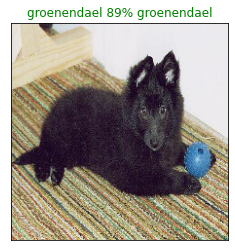

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,n=77)

Function to view top 10 predictions on an image

this function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using 'get_pred_label()'
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label as green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass
  

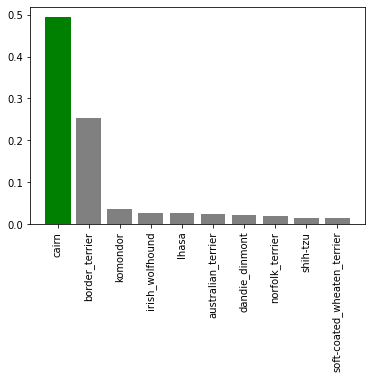

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=0)


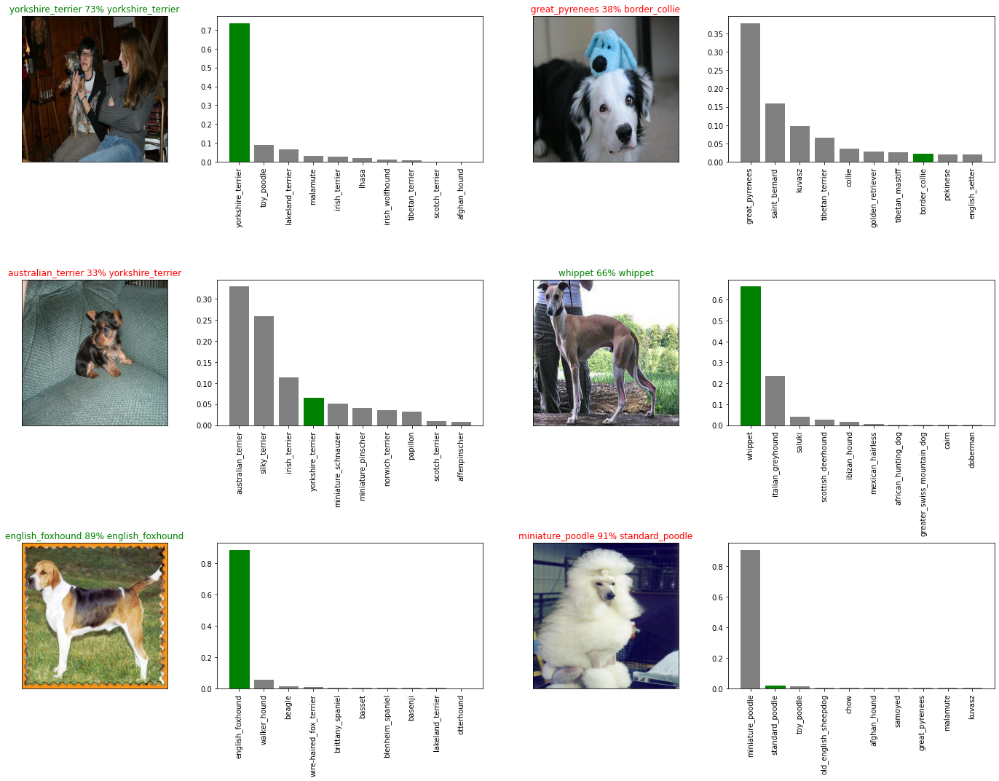

In [ ]:
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
def plot_confusion_matrix(cm,labels,
                          normalize=False,
                          title='confusion matrix',
                          cmap=plt.cm.Blues):
  """
  This function prints and plots the confusion matrix.
  """
  cm=confusion_matrix(val_labels,a,labels=unique_breeds)
  import itertools
  print(cm)

  plt.imshow(cm,interpolation='nearest',cmap=cmap)
  plt.title(title)
  plt.colorbar()
  tick_marks = np.arange(len(labels))
  plt.xticks(tick_marks, labels, rotation=45)
  plt.yticks(tick_marks, labels)
  fmt = 'd'
  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
      plt.text(j, i, format(cm[i, j], fmt),
              horizontalalignment="center",
              color="white" if cm[i, j] > thresh else "black")

  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.tight_layout()



[[2 0 0 ... 0 0 0]
 [0 4 0 ... 0 0 0]
 [0 0 2 ... 0 0 0]
 ...
 [0 0 0 ... 1 0 0]
 [0 0 0 ... 0 2 0]
 [0 0 0 ... 0 0 2]]


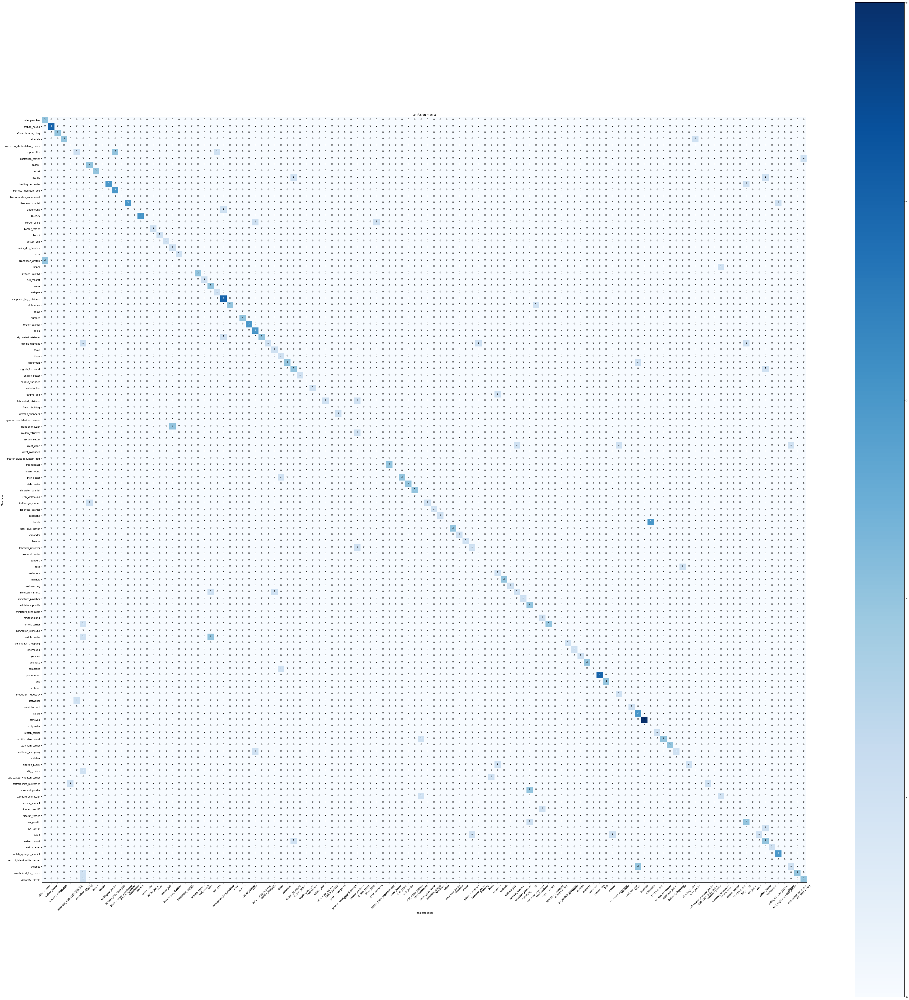

In [ ]:
plt.figure(figsize=(60,60))
plot_confusion_matrix(cm,labels=unique_breeds)

## Saving and Reloading a trained model

In [ ]:
# Creating a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in the models directory and appends a suffix.
  """

  model_dir = os.path.join("drive/MyDrive/Dog Vision/models",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = model_dir + "-" + suffix + ".h5"

  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#Creating a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model= tf.keras.models.load_model(model_path,
                                    custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20210716-09401626428440-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20210716-09401626428440-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model=load_model("drive/MyDrive/Dog Vision/models/20210716-09401626428440-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210716-09401626428440-1000-images-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 146ms/step - loss: 1.2272 - accuracy: 0.6850


[1.2271512746810913, 0.6850000023841858]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 144ms/step - loss: 1.2272 - accuracy: 0.6850


[1.2271512746810913, 0.6850000023841858]

## Training on the full data

In [ ]:
#Creating a data batch with the full dataset

full_data = create_data_batches(X,y)

Creating Training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
#Creating a model for full dataset

full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Creating callbacks
full_model_tensorboard=create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping= tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                            patience=3)
  

**Note:** Running the cell below will take a while(maybe 30 min for the first epoch)

In [ ]:
# Fit the model to full dataset
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3222s 10s/step - loss: 1.3254 - accuracy: 0.6692
Epoch 2/100
320/320 [==============================] - 39s 120ms/step - loss: 0.3982 - accuracy: 0.8829
Epoch 3/100
320/320 [==============================] - 38s 120ms/step - loss: 0.2365 - accuracy: 0.9367
Epoch 4/100
320/320 [==============================] - 38s 119ms/step - loss: 0.1517 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 38s 119ms/step - loss: 0.1057 - accuracy: 0.9802
Epoch 6/100
320/320 [==============================] - 39s 120ms/step - loss: 0.0781 - accuracy: 0.9865
Epoch 7/100
320/320 [==============================] - 38s 117ms/step - loss: 0.0581 - accuracy: 0.9922
Epoch 8/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0456 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0358 - accuracy: 0.9967
Epoch 10/100
320/320 [==============================] - 40s 125m

In [ ]:
save_model(full_model,suffix="full-image-dataset-mobilenetV2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20210716-11461626435973-full-image-dataset-mobilenetV2-Adam.h5...


'drive/MyDrive/Dog Vision/models/20210716-11461626435973-full-image-dataset-mobilenetV2-Adam.h5'

In [ ]:
loaded_full_model=load_model("drive/MyDrive/Dog Vision/models/20210716-11461626435973-full-image-dataset-mobilenetV2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20210716-11461626435973-full-image-dataset-mobilenetV2-Adam.h5


## Making Predictions on Test Data

To make predictions on the test data:
* Get the test image filenames
* Convert the filenames into test data batches using 'create_data_batches()' and setting the 'test_data' parameter to 'True'(since the test data doesn't have labels).
* Make a predictions array by passing the test batches

In [ ]:
# The format of the test input data should be same as the format of tha training data

test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[10]

'drive/MyDrive/Dog Vision/test/e4b76574d24800b91bdcfc886fb74f23.jpg'

In [ ]:
len(test_filenames)

10357

In [ ]:
# Creating test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Running the below cell will take a long time to run(~1hr)

In [ ]:
# make predictions on test data batch on loaded model trained on full dataset
test_predictions = loaded_full_model.predict(test_data,
                                     verbose=1)

324/324 [==============================] - 3463s 11s/step


In [ ]:
np.savetxt("drive/MyDrive/Dog Vision/pred_array.csv",test_predictions,delimiter=",")

In [ ]:
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/pred_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[3.24724212e-08, 1.57075291e-07, 1.66225173e-10, ...,
        6.66940808e-11, 3.88874469e-05, 1.09796659e-07],
       [1.56607262e-11, 2.07191729e-11, 2.89188187e-15, ...,
        1.58651971e-15, 3.23669140e-15, 4.16462568e-12],
       [4.56903919e-08, 1.08417941e-10, 1.85233958e-07, ...,
        1.72547054e-09, 9.02493369e-09, 1.26082148e-06],
       ...,
       [1.07608103e-10, 6.79002765e-09, 1.13657720e-13, ...,
        3.77981771e-13, 7.12366852e-13, 1.24209536e-15],
       [1.47299046e-14, 1.39623180e-09, 7.56653692e-13, ...,
        1.19128067e-08, 9.72281478e-10, 3.54934012e-14],
       [4.52364838e-12, 3.85549995e-11, 2.29202746e-12, ...,
        2.04463640e-14, 3.92114258e-10, 2.14376138e-11]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle
To get the data in this format:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data(the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a csv to submit to Kaggle 

In [ ]:
# Creating a Pandas DataFrame
preds_df= pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
#Append test image 'ID' to predictions DataFrame

test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e265af5e8f446888c6e7ec31f803d63e,3.24724e-08,1.57075e-07,1.66225e-10,2.06073e-10,4.82176e-07,1.15831e-07,5.45557e-12,6.40344e-08,7.341e-10,4.30264e-09,1.48019e-09,4.38531e-07,1.63305e-08,0.000611313,8.15385e-09,2.12998e-07,0.000617178,5.63729e-09,0.000121722,2.64018e-06,3.58987e-11,7.2206e-10,2.26561e-09,1.76289e-07,4.63742e-06,3.64221e-08,9.33699e-10,4.50393e-07,2.52073e-10,5.87973e-08,1.91194e-08,6.06875e-08,0.00248233,0.00185943,3.08457e-12,3.8383e-07,7.28858e-11,1.69854e-10,9.72461e-07,...,3.44034e-06,1.4019e-08,2.78286e-05,2.49816e-07,0.00066351,1.24996e-06,8.23747e-11,7.84735e-08,4.48679e-07,2.39346e-08,2.56165e-08,1.34268e-09,1.01825e-05,5.44292e-08,6.165e-07,1.95423e-08,1.69431e-09,1.3726e-11,1.95007e-11,6.75379e-06,6.95245e-06,0.0120247,1.51941e-05,4.14655e-11,9.43901e-09,4.96017e-05,3.61279e-07,1.66259e-09,9.87756e-07,3.37009e-05,1.41997e-09,9.98786e-08,6.85061e-10,2.20897e-05,1.59005e-08,6.69932e-06,3.717e-06,6.66941e-11,3.88874e-05,1.09797e-07
1,df92d68c07ec91b2f67cec77980e00cf,1.56607e-11,2.07192e-11,2.89188e-15,1.9746e-11,4.01578e-11,3.87714e-15,2.98607e-13,1.37604e-12,2.38681e-12,7.56548e-13,5.37447e-14,1.29584e-10,5.15806e-13,3.458e-11,8.41829e-13,7.03517e-16,1.30649e-13,4.07539e-16,4.4512e-14,2.73006e-14,9.55449e-12,1.58609e-10,8.1088e-13,2.58741e-11,1.77585e-13,1.61661e-10,4.08663e-13,8.76444e-15,4.76888e-12,3.9731e-13,0.999999,1.69175e-11,4.91803e-09,1.78408e-10,5.21253e-15,1.56901e-09,6.05195e-13,2.2428e-10,6.07169e-14,...,2.66206e-13,1.30635e-09,7.75089e-13,2.91315e-12,7.86362e-14,3.89754e-09,2.63358e-13,2.48682e-07,1.72839e-11,3.81145e-13,2.95632e-13,1.46036e-11,1.67963e-10,3.02465e-11,2.61693e-09,6.87634e-14,1.89586e-16,5.35269e-16,1.67818e-16,2.12333e-11,1.04541e-11,1.02209e-11,6.37836e-15,1.51367e-10,8.21048e-13,5.98573e-09,1.2692e-16,3.18091e-11,1.01483e-06,4.95961e-11,9.82468e-10,1.06123e-13,4.85818e-14,2.57279e-14,1.00813e-13,4.11811e-14,5.84306e-14,1.58652e-15,3.23669e-15,4.16463e-12
2,e35b90290702042d17ceee2aaf2d1475,4.56904e-08,1.08418e-10,1.85234e-07,1.20685e-08,2.65146e-08,2.97681e-12,5.11136e-06,3.39909e-08,1.18326e-08,1.55093e-08,2.06066e-11,4.69199e-08,1.1312e-08,2.02023e-10,7.23557e-09,1.28554e-11,4.07465e-08,2.23639e-06,4.8249e-10,3.57673e-10,3.00652e-08,6.27854e-10,2.58703e-07,7.78613e-08,1.84682e-11,3.71588e-10,0.0771216,8.36761e-07,1.64222e-10,1.15003e-08,7.40609e-08,1.62012e-09,2.21801e-09,9.57101e-11,1.35757e-11,8.32749e-05,1.01586e-06,8.30978e-07,3.72377e-10,...,7.5423e-09,0.922329,8.77014e-12,1.02349e-09,2.77861e-08,3.69688e-10,4.42861e-07,7.22249e-08,2.86717e-10,2.27751e-11,1.26576e-10,1.68602e-11,4.50153e-11,2.21455e-12,2.90942e-09,6.28187e-08,1.68451e-05,3.75849e-09,1.2061e-09,7.90631e-10,2.66784e-09,6.43093e-10,3.1904e-05,8.35338e-07,5.25181e-08,2.85843e-11,3.73213e-08,4.24154e-09,1.38536e-12,1.02616e-07,2.17723e-08,1.47425e-07,4.11901e-10,1.0416e-09,1.75914e-11,2.05517e-09,2.47056e-05,1.7

In [ ]:
#Adding the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e265af5e8f446888c6e7ec31f803d63e,3.24724e-08,1.57075e-07,1.66225e-10,2.06073e-10,4.82176e-07,1.15831e-07,5.45557e-12,6.40344e-08,7.341e-10,4.30264e-09,1.48019e-09,4.38531e-07,1.63305e-08,0.000611313,8.15385e-09,2.12998e-07,0.000617178,5.63729e-09,0.000121722,2.64018e-06,3.58987e-11,7.2206e-10,2.26561e-09,1.76289e-07,4.63742e-06,3.64221e-08,9.33699e-10,4.50393e-07,2.52073e-10,5.87973e-08,1.91194e-08,6.06875e-08,0.00248233,0.00185943,3.08457e-12,3.8383e-07,7.28858e-11,1.69854e-10,9.72461e-07,...,3.44034e-06,1.4019e-08,2.78286e-05,2.49816e-07,0.00066351,1.24996e-06,8.23747e-11,7.84735e-08,4.48679e-07,2.39346e-08,2.56165e-08,1.34268e-09,1.01825e-05,5.44292e-08,6.165e-07,1.95423e-08,1.69431e-09,1.3726e-11,1.95007e-11,6.75379e-06,6.95245e-06,0.0120247,1.51941e-05,4.14655e-11,9.43901e-09,4.96017e-05,3.61279e-07,1.66259e-09,9.87756e-07,3.37009e-05,1.41997e-09,9.98786e-08,6.85061e-10,2.20897e-05,1.59005e-08,6.69932e-06,3.717e-06,6.66941e-11,3.88874e-05,1.09797e-07
1,df92d68c07ec91b2f67cec77980e00cf,1.56607e-11,2.07192e-11,2.89188e-15,1.9746e-11,4.01578e-11,3.87714e-15,2.98607e-13,1.37604e-12,2.38681e-12,7.56548e-13,5.37447e-14,1.29584e-10,5.15806e-13,3.458e-11,8.41829e-13,7.03517e-16,1.30649e-13,4.07539e-16,4.4512e-14,2.73006e-14,9.55449e-12,1.58609e-10,8.1088e-13,2.58741e-11,1.77585e-13,1.61661e-10,4.08663e-13,8.76444e-15,4.76888e-12,3.9731e-13,0.999999,1.69175e-11,4.91803e-09,1.78408e-10,5.21253e-15,1.56901e-09,6.05195e-13,2.2428e-10,6.07169e-14,...,2.66206e-13,1.30635e-09,7.75089e-13,2.91315e-12,7.86362e-14,3.89754e-09,2.63358e-13,2.48682e-07,1.72839e-11,3.81145e-13,2.95632e-13,1.46036e-11,1.67963e-10,3.02465e-11,2.61693e-09,6.87634e-14,1.89586e-16,5.35269e-16,1.67818e-16,2.12333e-11,1.04541e-11,1.02209e-11,6.37836e-15,1.51367e-10,8.21048e-13,5.98573e-09,1.2692e-16,3.18091e-11,1.01483e-06,4.95961e-11,9.82468e-10,1.06123e-13,4.85818e-14,2.57279e-14,1.00813e-13,4.11811e-14,5.84306e-14,1.58652e-15,3.23669e-15,4.16463e-12
2,e35b90290702042d17ceee2aaf2d1475,4.56904e-08,1.08418e-10,1.85234e-07,1.20685e-08,2.65146e-08,2.97681e-12,5.11136e-06,3.39909e-08,1.18326e-08,1.55093e-08,2.06066e-11,4.69199e-08,1.1312e-08,2.02023e-10,7.23557e-09,1.28554e-11,4.07465e-08,2.23639e-06,4.8249e-10,3.57673e-10,3.00652e-08,6.27854e-10,2.58703e-07,7.78613e-08,1.84682e-11,3.71588e-10,0.0771216,8.36761e-07,1.64222e-10,1.15003e-08,7.40609e-08,1.62012e-09,2.21801e-09,9.57101e-11,1.35757e-11,8.32749e-05,1.01586e-06,8.30978e-07,3.72377e-10,...,7.5423e-09,0.922329,8.77014e-12,1.02349e-09,2.77861e-08,3.69688e-10,4.42861e-07,7.22249e-08,2.86717e-10,2.27751e-11,1.26576e-10,1.68602e-11,4.50153e-11,2.21455e-12,2.90942e-09,6.28187e-08,1.68451e-05,3.75849e-09,1.2061e-09,7.90631e-10,2.66784e-09,6.43093e-10,3.1904e-05,8.35338e-07,5.25181e-08,2.85843e-11,3.73213e-08,4.24154e-09,1.38536e-12,1.02616e-07,2.17723e-08,1.47425e-07,4.11901e-10,1.0416e-09,1.75914e-11,2.05517e-09,2.47056e-05,1.7

In [ ]:
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_2_.csv",
               index=False)

### Making Predictions on Custom Images

To do so :
* Get the filepaths of custom images
* Turn the filepaths into data batches using 'create_data_batches()'. And since our images don't have labels associated, set the parameter 'test_data' to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the predicted labels to the custom images.


In [ ]:
custom_path = "drive/MyDrive/Dog Vision/custom images/"
custom_image_paths= [custom_path +fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/custom images/970406b4-6089-463f-842b-49347ded38a3 (2).jpeg',
 'drive/MyDrive/Dog Vision/custom images/970406b4-6089-463f-842b-49347ded38a3 (1).jpeg',
 'drive/MyDrive/Dog Vision/custom images/970406b4-6089-463f-842b-49347ded38a3 (3).jpeg',
 'drive/MyDrive/Dog Vision/custom images/970406b4-6089-463f-842b-49347ded38a3 (4).jpeg']

In [ ]:
custom_data = create_data_batches(custom_image_paths,test_data=True)

Creating test data batches...


In [ ]:
# Making predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(4, 120)

In [ ]:
# Get prediction Labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['great_dane', 'kelpie', 'labrador_retriever', 'malinois']

In [ ]:
custom_images = []

for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

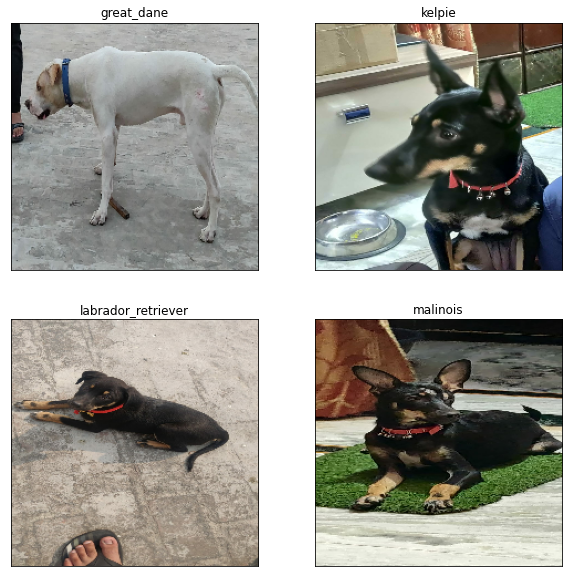

In [ ]:
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(2,2,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)